In [167]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
%matplotlib inline

In [168]:
words=open('names.txt','r').read().splitlines()
words[:8]

['emma', 'olivia', 'ava', 'isabella', 'sophia', 'charlotte', 'mia', 'amelia']

In [169]:
len(words)

32033

In [170]:
#build the vocabulary of the character
chars=sorted(list(set(''.join(words)))) 
stoi={s:i+1 for i,s in enumerate(chars)}
stoi['.']=0
itos={i:s for s,i in stoi.items()}
itos


{1: 'a',
 2: 'b',
 3: 'c',
 4: 'd',
 5: 'e',
 6: 'f',
 7: 'g',
 8: 'h',
 9: 'i',
 10: 'j',
 11: 'k',
 12: 'l',
 13: 'm',
 14: 'n',
 15: 'o',
 16: 'p',
 17: 'q',
 18: 'r',
 19: 's',
 20: 't',
 21: 'u',
 22: 'v',
 23: 'w',
 24: 'x',
 25: 'y',
 26: 'z',
 0: '.'}

In [171]:
block_size=3
X,Y=[],[]

for w in words:
    
    print(w)
    context=[0]*block_size
    for ch in w + '.':
        ix=stoi[ch]
        X.append(context)
        Y.append(ix)
        print(''.join(itos[i] for i in context),'-->',itos[ix])
        context=context[1:]+[ix]
        
X=torch.tensor(X)        
Y=torch.tensor(Y)        

emma
... --> e
..e --> m
.em --> m
emm --> a
mma --> .
olivia
... --> o
..o --> l
.ol --> i
oli --> v
liv --> i
ivi --> a
via --> .
ava
... --> a
..a --> v
.av --> a
ava --> .
isabella
... --> i
..i --> s
.is --> a
isa --> b
sab --> e
abe --> l
bel --> l
ell --> a
lla --> .
sophia
... --> s
..s --> o
.so --> p
sop --> h
oph --> i
phi --> a
hia --> .
charlotte
... --> c
..c --> h
.ch --> a
cha --> r
har --> l
arl --> o
rlo --> t
lot --> t
ott --> e
tte --> .
mia
... --> m
..m --> i
.mi --> a
mia --> .
amelia
... --> a
..a --> m
.am --> e
ame --> l
mel --> i
eli --> a
lia --> .
harper
... --> h
..h --> a
.ha --> r
har --> p
arp --> e
rpe --> r
per --> .
evelyn
... --> e
..e --> v
.ev --> e
eve --> l
vel --> y
ely --> n
lyn --> .
abigail
... --> a
..a --> b
.ab --> i
abi --> g
big --> a
iga --> i
gai --> l
ail --> .
emily
... --> e
..e --> m
.em --> i
emi --> l
mil --> y
ily --> .
elizabeth
... --> e
..e --> l
.el --> i
eli --> z
liz --> a
iza --> b
zab --> e
abe --> t
bet --> h
eth --> .

In [172]:
# ---build the dataset
def build_dataset(words):
    block_size=3 #context length: how many characters do we take to predict the next one?
    X,Y=[],[]
    for w in words:
        context=[0]*block_size
        for ch in w + '.':
            ix=stoi[ch]
            X.append(context)
            Y.append(ix)
            context=context[1:] + [ix] #crop and append
    X=torch.tensor(X)
    Y=torch.tensor(Y)
    print(X.shape,Y.shape)
    return X,Y

import random
random.seed(42)
random.shuffle(words)
n1=int(0.8*len(words))
n2=int(0.9*len(words))

Xtr,Ytr=build_dataset(words[:n1])
Xdev,Ydev=build_dataset(words[n1:n2])
Xte,Yte=build_dataset(words[n2])
             

torch.Size([182625, 3]) torch.Size([182625])
torch.Size([22655, 3]) torch.Size([22655])
torch.Size([14, 3]) torch.Size([14])


In [173]:
len(words)

32033

In [174]:
n1

25626

In [175]:
n2

28829

In [176]:
n2-n1

3203

In [177]:
len(words)-n2

3204

In [178]:
Y

tensor([ 5, 13, 13,  ..., 26, 24,  0])

In [179]:
X.shape,X.dtype,Y.shape,Y.dtype

(torch.Size([228146, 3]), torch.int64, torch.Size([228146]), torch.int64)

In [180]:
C=torch.randn((27,2))

In [181]:
C[5]

tensor([-0.2823,  0.0384])

In [182]:
C[X].shape

torch.Size([228146, 3, 2])

In [183]:
C[X][13,2]

tensor([-1.0875,  0.4012])

In [184]:
X[13,2]

tensor(1)

In [185]:
C[1]

tensor([-1.0875,  0.4012])

In [186]:
# torch.concat((emb[:,0,:],emb[:,1,:],emb[:,2,:]),1).shape  #not generalized
# torch.concat(torch.unbind(emb,1),1).shape     #not so efficient

In [187]:
a=torch.arange(10)
a

tensor([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])

In [188]:
a.shape

torch.Size([10])

In [189]:
a.view 

<function Tensor.view>

In [190]:
a.storage()

 0
 1
 2
 3
 4
 5
 6
 7
 8
 9
[torch.storage.TypedStorage(dtype=torch.int64, device=cpu) of size 10]

now more cleaner with all stuff again

In [192]:
Xtr.shape,Ytr.shape #dataset

(torch.Size([182625, 3]), torch.Size([182625]))

In [212]:
g=torch.Generator().manual_seed(2147483647)
C=torch.randn((27,10),generator=g)
W1=torch.randn((30,200),generator=g)
B1=torch.randn(200,generator=g)
W2=torch.randn((200,27),generator=g)
B2=torch.randn(27,generator=g)
parameters=[C,W1,B1,W2,B2]

In [213]:
sum(p.nelement() for p in parameters) #number of total parameters

11897

In [214]:
for p in parameters:
    p.requires_grad=True

In [215]:
lre=torch.linspace(-3,0,1000)
lrs=10**lre


In [216]:
lri=[]
lossi=[]
steps=[]

In [217]:
for i in range(300000):
    
#forward pass
    ix=torch.randint(0,Xtr.shape[0],(32,))
    emb=C[Xtr[ix]] #(32,3,10)
    h=torch.tanh(emb.view(-1,30) @ W1 + B1) #(32,100)
    logits=h @ W2 +B2
    # counts=logits.exp()
    # probs=counts/counts.sum(1,keepsdim=True)
    # loss=-probs(torch.arange(32),Y)
    loss=F.cross_entropy(logits,Ytr[ix])  #same as above
    print(loss.item())
    
    #backward pass 
    for p in parameters:
        p.grad=None
    loss.backward()
    #update
    # lr=lrs[i]
    lr=0.1 if i < 100000 else 0.01
    for p in parameters:
        p.data+=-lr*p.grad
        
    #track stats
    # lri.append(lre[i])
    steps.append(i)
    lossi.append(loss.log10().item())
            

26.36393928527832
22.41527557373047
20.376632690429688
23.351696014404297
20.766809463500977
23.089744567871094
19.887401580810547
21.4562931060791
21.16924476623535
13.9744873046875
13.998409271240234
16.82143783569336
18.867572784423828
16.966548919677734
13.803155899047852
12.747812271118164
14.652409553527832
13.935577392578125
11.659891128540039
15.937782287597656
14.842452049255371
15.981722831726074
16.727298736572266
15.362455368041992
13.225266456604004
17.51310920715332
11.994650840759277
13.694397926330566
11.615926742553711
15.837574005126953
13.160919189453125
11.977693557739258
13.120410919189453
11.156782150268555
12.901449203491211
8.686558723449707
10.585012435913086
15.563352584838867
9.86245346069336
10.983245849609375
12.205267906188965
14.537853240966797
9.416735649108887
10.48138427734375
13.219817161560059
10.316638946533203
10.979020118713379
11.129854202270508
11.334124565124512
11.272247314453125
11.22799015045166
8.888233184814453
8.970023155212402
11.1000032

In [218]:
emb=C[Xdev] #(32,3,2)
h=torch.tanh(emb.view(-1,30) @ W1 + B1) #(32,100)
logits=h @ W2 +B2
# counts=logits.exp()
# probs=counts/counts.sum(1,keepsdim=True)
# loss=-probs(torch.arange(32),Y)
loss=F.cross_entropy(logits,Ydev)  #same as above
print(loss.item())

2.1537818908691406


In [219]:
emb=C[Xte] #(32,3,2)
h=torch.tanh(emb.view(-1,30) @ W1 + B1) #(32,100)
logits=h @ W2 +B2
# counts=logits.exp()
# probs=counts/counts.sum(1,keepsdim=True)
# loss=-probs(torch.arange(32),Y)
loss=F.cross_entropy(logits,Yte)  #same as above
print(loss.item())

6.432339191436768


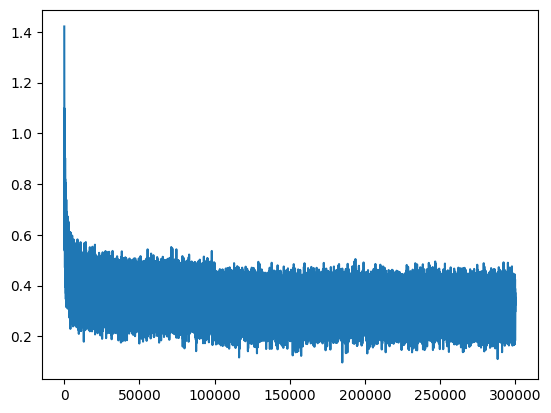

In [220]:
plt.plot(steps,lossi)

In [221]:
torch.randint(0,5,(32,))

tensor([0, 1, 0, 1, 0, 1, 1, 3, 1, 0, 4, 2, 1, 3, 1, 3, 3, 4, 2, 4, 3, 4, 0, 2,
        4, 0, 0, 3, 0, 4, 4, 2])

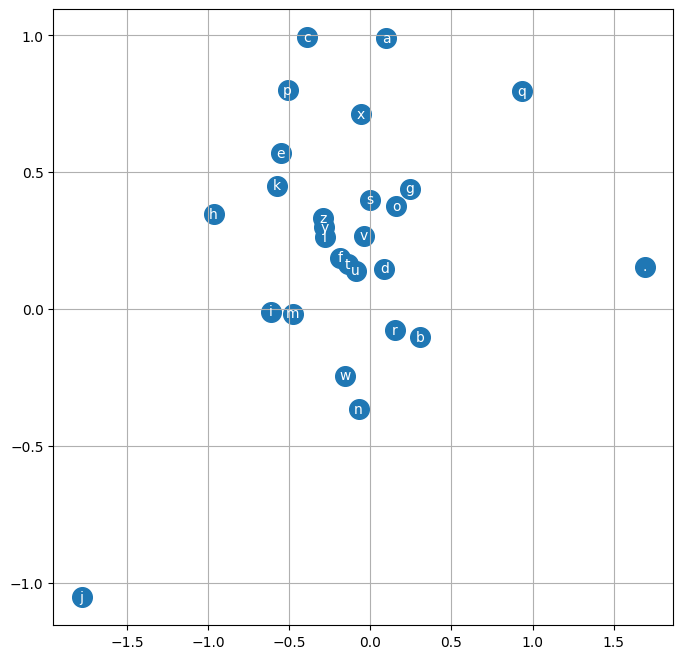

In [222]:
# visualize dimensions 0 and 1 of the embedding matrix C for all characters
plt.figure(figsize=(8,8))
plt.scatter(C[:,0].data,C[:,1].data,s=200)
for i in range(C.shape[0]):
    plt.text(C[i,0].item(),C[i,1].item(),itos[i],ha='center',va='center',color='white')
plt.grid('minor')    

In [223]:
# sample from the model
g = torch.Generator().manual_seed(2147483647 + 10)

for _ in range(20):
    
    out = []
    context = [0] * block_size # initialize with all ...
    while True:
      emb = C[torch.tensor([context])] # (1,block_size,d)
      h = torch.tanh(emb.view(1, -1) @ W1 + B1)
      logits = h @ W2 + B2
      probs = F.softmax(logits, dim=1)
      ix = torch.multinomial(probs, num_samples=1, generator=g).item()
      context = context[1:] + [ix]
      out.append(ix)
      if ix == 0:
        break
    
    print(''.join(itos[i] for i in out))

mohaal.
yaz.
seel.
nihah.
lorensleighdraega.
zeredieliah.
milopaleke.
seananaraelyzion.
kalin.
shubergiaghiel.
kin.
renlee.
jothana.
ubuka.
dariyah.
faeha.
kayshaston.
mahia.
salyansun.
zakelle.
